In [22]:
import torch
import matplotlib.pyplot as plt
from pathlib import Path
import random
import numpy as np
from PIL import Image

In [5]:
model = torch.hub.load('ultralytics/yolov5','custom',path='best.pt',force_reload=True)

Downloading: "https://github.com/ultralytics/yolov5/zipball/master" to C:\Users\amith/.cache\torch\hub\master.zip
YOLOv5  2023-9-30 Python-3.11.4 torch-2.0.1+cpu CPU

Fusing layers... 
Model summary: 157 layers, 7055974 parameters, 0 gradients, 15.9 GFLOPs
Adding AutoShape... 


In [9]:
dirpath = Path('datas')

In [12]:
images = list(dirpath.glob('*/*.jpg'))

In [13]:
len(images)

65

In [19]:
rand_image = random.choice(images)

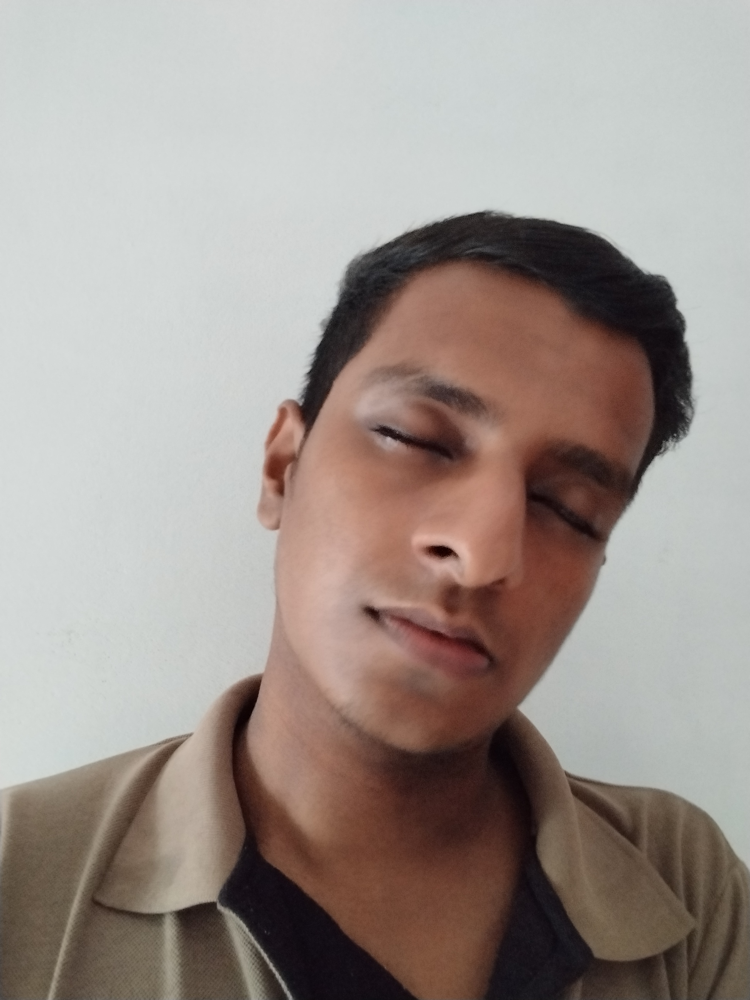

In [21]:
img = Image.open(rand_image)
img

In [32]:
image_as_array = np.array(img)
image_as_array,image_as_array.shape

(array([[[208, 210, 209],
         [210, 212, 211],
         [210, 212, 211],
         ...,
         [203, 205, 204],
         [204, 206, 205],
         [203, 205, 204]],
 
        [[211, 213, 212],
         [211, 213, 212],
         [210, 212, 211],
         ...,
         [204, 206, 205],
         [204, 206, 205],
         [204, 206, 205]],
 
        [[209, 211, 210],
         [209, 211, 210],
         [208, 210, 209],
         ...,
         [204, 206, 205],
         [204, 206, 205],
         [203, 205, 204]],
 
        ...,
 
        [[ 81,  77,  74],
         [ 88,  84,  81],
         [ 86,  82,  79],
         ...,
         [ 93,  90,  85],
         [ 87,  84,  79],
         [ 89,  86,  81]],
 
        [[ 76,  72,  69],
         [ 84,  80,  77],
         [ 82,  78,  75],
         ...,
         [ 89,  86,  81],
         [ 86,  82,  79],
         [ 87,  83,  80]],
 
        [[ 75,  71,  68],
         [ 85,  81,  78],
         [ 81,  77,  74],
         ...,
         [ 88,  85,  80],
  

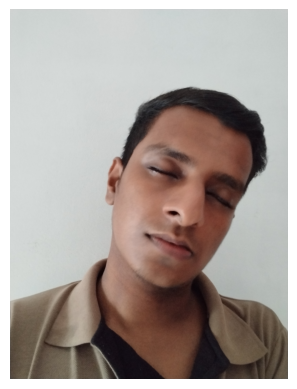

In [33]:
%matplotlib inline
plt.imshow(image_as_array)
plt.show()

In [37]:
result = model(rand_image)
result,type(result)

(YOLOv5 <class 'models.common.Detections'> instance
 image 1/1: 2592x1944 1 sleep
 Speed: 91.9ms pre-process, 558.0ms inference, 0.0ms NMS per image at shape (1, 3, 640, 480),
 models.common.Detections)

In [66]:
def plot(result):
    %matplotlib inline
    plt.imshow(np.squeeze(result.render()))
    plt.axis(False)
    plt.show()
    

In [43]:
def prediction(images:list):
    rand_image = random.choice(images)
    result = model(rand_image)
    plot(result)

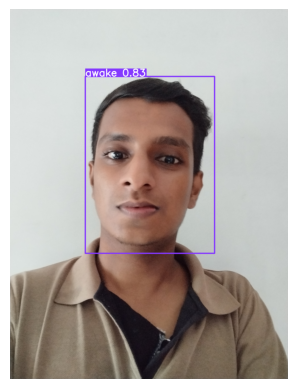

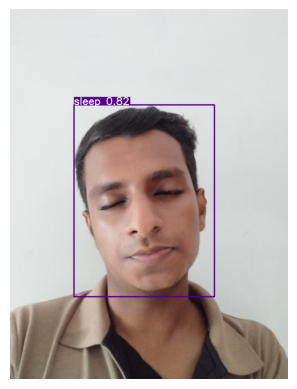

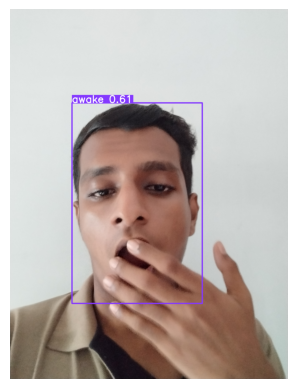

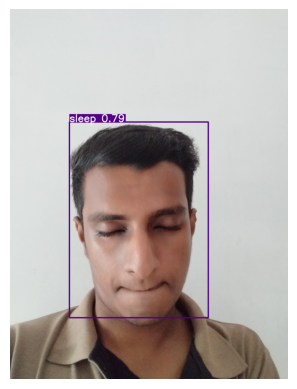

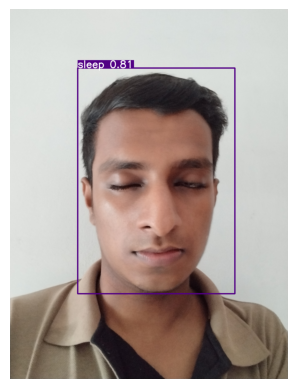

...

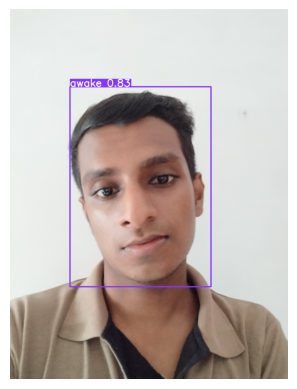

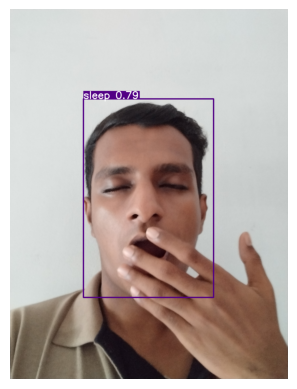

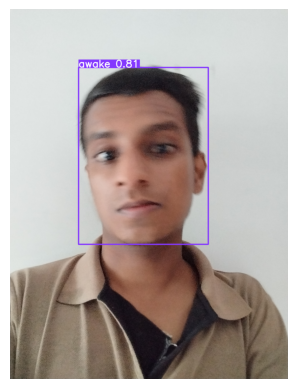

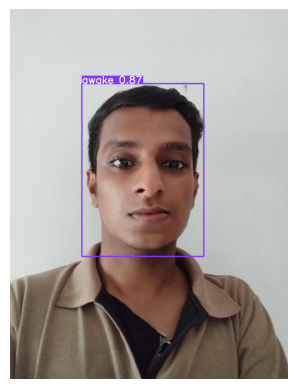

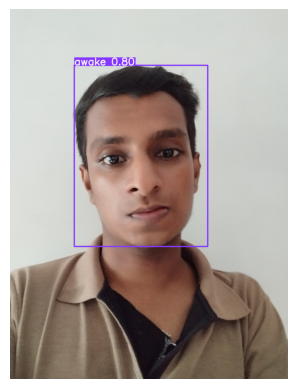

In [71]:
for i in range(65):
    prediction(images)